<a href="https://colab.research.google.com/github/joel-soffo/MScFE-690-CAPSTONE/blob/main/MScFE_690_Capstone_Group_4513.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Impact of Covid-19 on  Financial Markets

##CAPSTONE PROJECT

###Zixu Li ,  Muhammad Imran ,  Joel Stéphane FEUSSI SOFFO
####*Worldquant University*


#####*(zli27@crimson.ua.edu ,cpa.imran@gmail.com ,feussistephane@gmail.com)*

#### Loading packages and configuring

In [ ]:
!pip install arch
!pip install tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.7/981.7 kB 3.3 MB/s eta 0:00:00


In [ ]:
# Import libraries
import plotly.io as pio
pio.renderers.default = 'colab'


import yfinance as yf
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
from scipy import stats
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.api import VAR
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.vector_ar.var_model import VAR
from arch import arch_model
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import GridSearchCV

####Scenario analysis: We can use Monte Carlo simulation, stress testing, or other techniques to generate scenarios of how COVID-19 could evolve and affect financial markets. We can analyze the probabilities and impacts of these scenarios on different asset classes and portfolios.

In [ ]:
# Define assets in each category
equities = ["SPY", "^DJI", "^IXIC"]
currencies = ["EURUSD=X", "GBPUSD=X"]
bonds = ["^TNX", "TLT", "LQD", "HYG"]
commodities = ["CL=F", "HG=F", "ZW=F"]

# Combine assets into a single list
all_assets = equities + currencies + bonds + commodities

# Download data from Yahoo Finance
data = yf.download(all_assets, start="2019-01-01", end="2022-01-01")

# Set random seed for reproducibility
np.random.seed(42)

# Define the number of scenarios and the time horizon
n_scenarios = 1000
n_days = 365

# Calculate the daily returns and the annualized volatility of each asset
returns = data['Adj Close'].dropna().pct_change()
volatility = returns.std() * np.sqrt(252)



[*********************100%%**********************]  12 of 12 completed


In [ ]:
# Reindex the volatility vector to match the asset list
volatility = volatility.reindex(all_assets)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print (volatility)


SPY         0.219391
^DJI        0.235546
^IXIC       0.247279
EURUSD=X    0.062149
GBPUSD=X    0.089709
^TNX        0.760175
TLT         0.163553
LQD         0.108385
HYG         0.106388
CL=F        2.011213
HG=F        0.222533
ZW=F        0.273166
dtype: float64


In [ ]:
data=data['Adj Close']

In [ ]:
# Reindex the data dataframe to match the asset list
data = data.reindex(columns=all_assets)
data

,SPY,^DJI,^IXIC,EURUSD=X,GBPUSD=X,^TNX,TLT,LQD,HYG,CL=F,HG=F,ZW=F
Date,,,,,,,,,,,,
2019-01-01,NaN,NaN,NaN,1.149306,1.273804,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-02,231.492249,23346.240234,6665.939941,1.146171,1.275429,2.661,109.700531,97.039032,63.253769,46.540001,2.6250,506.75
2019-01-03,225.968216,22686.220703,6463.500000,1.131811,1.252191,2.554,110.948875,97.081902,63.284988,47.090000,2.5705,513.75
2019-01-04,233.537140,23433.160156,6738.859863,1.139108,1.262881,2.659,109.664597,97.021873,64.347160,47.959999,2.6515,517.00
2019-01-07,235.378494,23531.349609,6823.470215,1.141044,1.273496,2.682,109.341301,97.030479,64.971970,48.520000,2.6410,516.75
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,464.485443,36302.378906,15871.259766,1.132426,1.340430,1.481,141.024567,124.207832,78.543442,75.570000,4.4650,804.00
2021-12-28,464.105835,36398.210938,15781.719727,1.133003,1.344267,1.481,140.465714,124.049164,78.507423,75.980003,4.4200,783.50
2021-12-29,464.699554,36488.628906,15766.219727,1.131478,1.343328,1.543,138.931198,123.367889,78.381416,76.559998,4.4020,787.75


<ipython-input-7-d1495d85e3d5>:16: RuntimeWarning:

overflow encountered in multiply



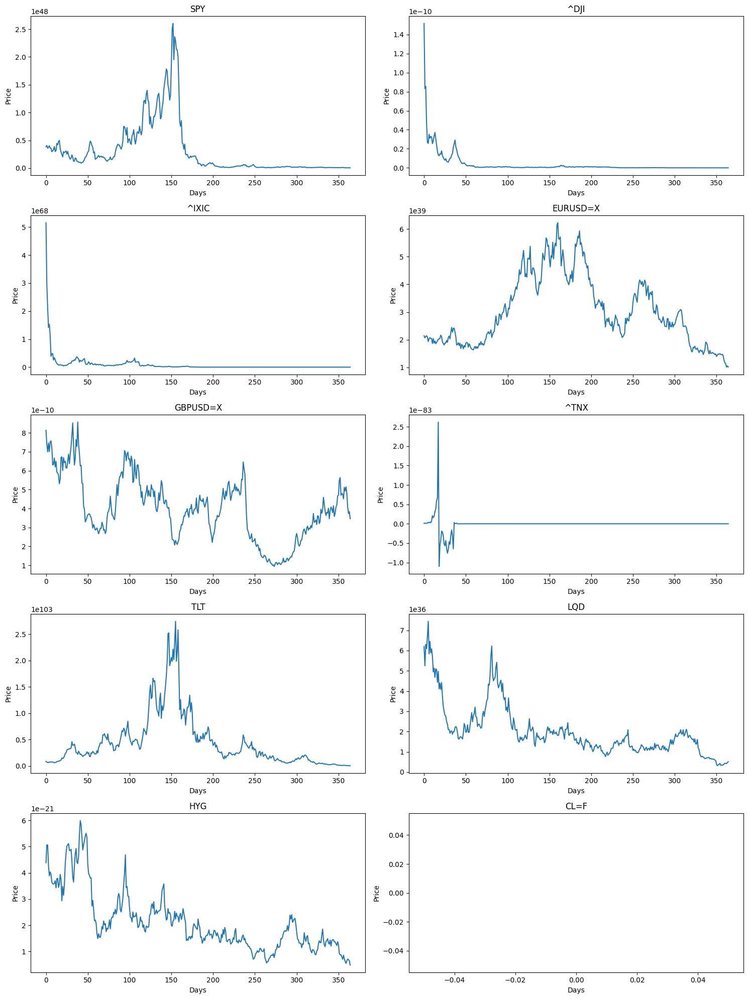

In [ ]:
# Generate random scenarios of daily returns using a normal distribution
scenarios = np.random.normal(0, volatility, size=(n_days, len(all_assets)))

# Initialize an empty dataframe to store the simulated prices
prices = pd.DataFrame(index=range(n_days), columns=all_assets)

# Set the initial prices as the last observed prices
prices.iloc[0] = data.iloc[-1]

# Loop over each scenario and each asset
for i in range(n_scenarios):
    for j in range(len(all_assets)):
        # Calculate the cumulative returns from the scenarios
        cum_returns = np.cumprod(1 + scenarios[:, j])
        # Multiply the initial prices by the cumulative returns to get the simulated prices
        prices[all_assets[j]] = prices.iloc[0, j] * cum_returns

# Plot the simulated prices for each asset
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
for i, ax in enumerate(axes.flatten()):
    ax.plot(prices[all_assets[i]])
    ax.set_title(all_assets[i])
    ax.set_xlabel("Days")
    ax.set_ylabel("Price")
plt.tight_layout()
plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

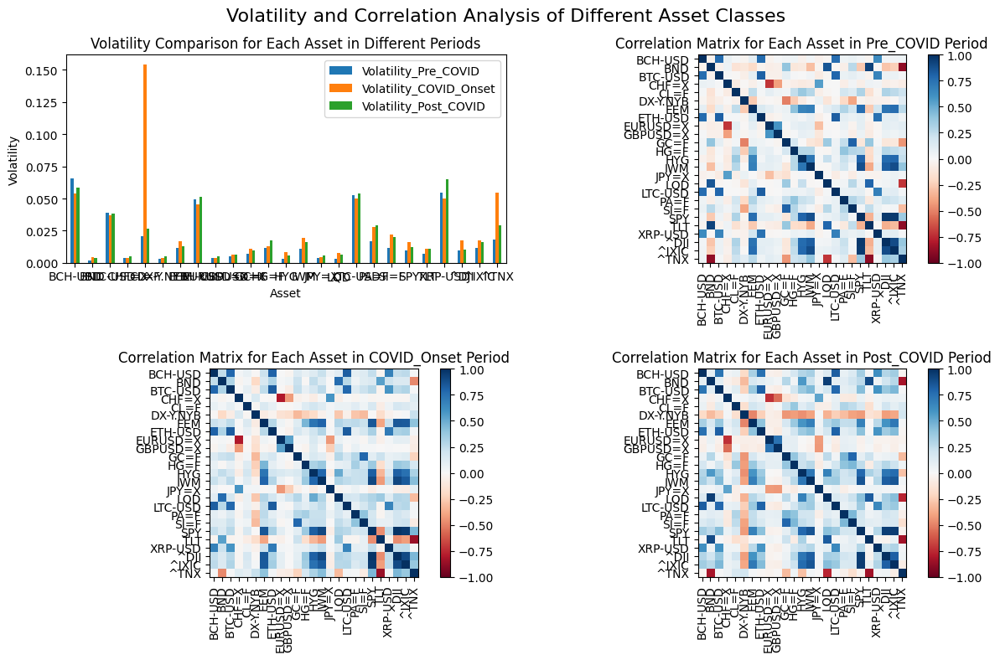

In [ ]:
# Define a list of assets in each category
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]
foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"]
cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

# Combine all assets into a single list with their respective groups
assets = equities + fixed_income + commodities + foreign_currencies + cryptocurrencies
asset_groups = {
    "Equities": equities,
    "Fixed Income": fixed_income,
    "Commodities": commodities,
    "Foreign Currencies": foreign_currencies,
    "Cryptocurrencies": cryptocurrencies
}

# Download data for all assets
data = []
for group, assets_in_group in asset_groups.items():
    for asset in assets_in_group:
        asset_data = yf.download(asset, start='2018-01-01', end='2022-12-31')['Adj Close'].to_frame()
        asset_data['Asset'] = asset
        asset_data['Asset Group'] = group
        data.append(asset_data)

# Concatenate data for all asset groups into a single DataFrame
df = pd.concat(data)

# Reset index to move 'Date' from index to a column
df.reset_index(inplace=True)

# Define the date ranges for the different periods
pre_covid_start = '2018-01-01'
pre_covid_end = '2019-12-31'
covid_onset_start = '2019-01-01'
covid_onset_end = '2020-12-31'
post_covid_start = '2021-01-01'
post_covid_end = '2022-12-31'

# Drop rows with missing values in the 'Adj Close' column
df.dropna(subset=['Adj Close'], inplace=True)

# Convert 'Adj Close' column to numeric (if necessary)
df['Adj Close'] = pd.to_numeric(df['Adj Close'], errors='coerce')

# Calculate daily returns for each asset
df['Return'] = df.groupby('Asset')['Adj Close'].pct_change()

# Now proceed with filtering data for different periods and further analysis as before


# Filter the data for each period
pre_covid_data = df[(df['Date'] >= pre_covid_start) & (df['Date'] <= pre_covid_end)]
covid_onset_data = df[(df['Date'] >= covid_onset_start) & (df['Date'] <= covid_onset_end)]
post_covid_data = df[(df['Date'] >= post_covid_start) & (df['Date'] <= post_covid_end)]


# Calculate the volatility for each asset in each period
pre_covid_volatility = pre_covid_data.groupby('Asset')['Return'].std().reset_index()
covid_onset_volatility = covid_onset_data.groupby('Asset')['Return'].std().reset_index()
post_covid_volatility = post_covid_data.groupby('Asset')['Return'].std().reset_index()

# Merge the volatility data for all periods into a single DataFrame
comparative_volatility = pre_covid_volatility.merge(covid_onset_volatility, on='Asset').merge(post_covid_volatility, on='Asset')
comparative_volatility.columns = ['Asset', 'Volatility_Pre_COVID', 'Volatility_COVID_Onset', 'Volatility_Post_COVID']

# Display the comparative table
print("Comparative Volatility for Each Asset in Different Periods:")
print(comparative_volatility)

# Compare the volatility of each asset across the periods and identify the most and least volatile assets in each period
for period in ['Pre_COVID', 'COVID_Onset', 'Post_COVID']:
    sorted_volatility = comparative_volatility.sort_values(by=f'Volatility_{period}', ascending=False)
    most_volatile = sorted_volatility.iloc[0]
    least_volatile = sorted_volatility.iloc[-1]
    print(f"During the {period} period, the most volatile asset was {most_volatile['Asset']} with a volatility of {most_volatile[f'Volatility_{period}']:.4f}, and the least volatile asset was {least_volatile['Asset']} with a volatility of {least_volatile[f'Volatility_{period}']:.4f}.")

for period in ['Pre_COVID', 'COVID_Onset', 'Post_COVID']:
    data = eval(f'{period.lower()}_data')
    correlation_matrix = data.pivot(index='Date', columns='Asset', values='Return').corr().abs().unstack().sort_values(ascending=False)
    correlation_matrix = correlation_matrix[correlation_matrix != 1]  # Exclude self-correlations

    if not correlation_matrix.empty:
        most_correlated_assets = correlation_matrix.idxmax()
        least_correlated_assets = correlation_matrix.idxmin()

        most_correlation = correlation_matrix.max()
        least_correlation = correlation_matrix.min()

        print(f"During the {period} period, the most correlated pair of assets was {most_correlated_assets} with a correlation of {most_correlation:.4f}, and the least correlated pair of assets was {least_correlated_assets} with a correlation of {least_correlation:.4f}.")
    else:
        print(f"No correlation data available for the {period} period.")



# Visualize the volatility and correlation results using appropriate charts and graphs
plt.figure(figsize=(12, 8))
plt.suptitle('Volatility and Correlation Analysis of Different Asset Classes', fontsize=16)

# Plot the bar chart for the volatility
plt.subplot(2, 2, 1)
comparative_volatility.plot(x='Asset', kind='bar', rot=0, ax=plt.gca())
plt.ylabel('Volatility')
plt.legend(loc='upper right')
plt.title('Volatility Comparison for Each Asset in Different Periods')

# Plot the heatmaps for the correlation
for i, period in enumerate(['Pre_COVID', 'COVID_Onset', 'Post_COVID'], 2):
    plt.subplot(2, 2, i)
    data = eval(f'{period.lower()}_data')
    correlation_matrix = correlation_matrix = data.pivot(index='Date', columns='Asset', values='Return').corr()
    plt.imshow(correlation_matrix, cmap='RdBu', vmin=-1, vmax=1)
    plt.colorbar()
    plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
    plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
    plt.title(f'Correlation Matrix for Each Asset in {period} Period')

# Adjust the layout and show the plots
plt.tight_layout()
plt.show()

In [ ]:
# Define a list of assets in each category
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]
vix = ["^VIX"]
foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"]
cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

# Combine all assets into a single list
assets = equities + fixed_income + commodities + vix + foreign_currencies + cryptocurrencies

# Download data for all assets
df = yf.download(assets, start='2018-01-01', end='2022-12-31')['Adj Close'].dropna()

# Reset index to move 'Date' from index to a column
df.reset_index(inplace=True)

# Define the date ranges for the different periods
pre_covid_start = '2018-01-01'
pre_covid_end = '2019-12-31'
covid_onset_start = '2019-01-01'
covid_onset_end = '2020-12-31'
post_covid_start = '2021-01-01'
post_covid_end = '2022-12-31'

# Filter the data for each period
pre_covid_data = df[(df['Date'] >= pre_covid_start) & (df['Date'] <= pre_covid_end)].copy()
covid_onset_data = df[(df['Date'] >= covid_onset_start) & (df['Date'] <= covid_onset_end)].copy()
post_covid_data = df[(df['Date'] >= post_covid_start) & (df['Date'] <= post_covid_end)].copy()

# Calculate the daily returns for each asset
pre_covid_data['Return'] = pre_covid_data.iloc[:, 1:].pct_change(axis=1).mean(axis=1)
covid_onset_data['Return'] = covid_onset_data.iloc[:, 1:].pct_change(axis=1).mean(axis=1)
post_covid_data['Return'] = post_covid_data.iloc[:, 1:].pct_change(axis=1).mean(axis=1)

# Calculate the volatility for each asset in each period
pre_covid_volatility = pre_covid_data.std().reset_index()
covid_onset_volatility = covid_onset_data.std().reset_index()
post_covid_volatility = post_covid_data.std().reset_index()

# Merge the volatility data for all periods into a single DataFrame
comparative_volatility = pre_covid_volatility.merge(covid_onset_volatility, on='index').merge(post_covid_volatility, on='index')
comparative_volatility.columns = ['Asset', 'Volatility_Pre_COVID', 'Volatility_COVID_Onset', 'Volatility_Post_COVID']

# Display the comparative table
print("Comparative Volatility for Each Asset in Different Periods:")
print(comparative_volatility)

# ... (continue with the rest of your analysis and visualization code)

[*********************100%%**********************]  26 of 26 completed
Comparative Volatility for Each Asset in Different Periods:
       Asset         Volatility_Pre_COVID       Volatility_COVID_Onset  \
0       Date  210 days 16:07:33.308509404  211 days 09:09:29.880826660   
1    BCH-USD                   483.052485                    78.327054   
2        BND                     2.970769                     3.812539   
3    BTC-USD                  2519.587762                   4034.77683   
4      CHF=X                     0.018792                     0.035598   
5       CL=F                        6.689                    12.233242   
6   DX-Y.NYB                     2.736696                     2.457954   
7        EEM                     2.441284                     3.539218   
8    ETH-USD                   255.499856                   125.467474   
9   EURUSD=X                     0.041428                     0.034557   
10  GBPUSD=X                     0.051206              

In [ ]:
# Define a function to calculate the correlation matrix for a list of assets
def calculate_correlation_matrix(assets, data_dict, start_date, end_date):
  # Create an empty DataFrame to store the returns for each asset
  returns_df = pd.DataFrame()
  # Loop through the assets and extract the returns data for the given period
  for asset in assets:
    data = data_dict[asset]
    if isinstance(data, pd.Series):
      data = data.to_frame(asset)  # Convert Series to DataFrame
    # data.index = pd.to_datetime(data.index)
    returns = data[(data.index >= 0) & (data.index <= 365)][asset]
    returns_df[asset] = returns
    print(data.index)
  # Drop any rows with missing values
  returns_df = returns_df.dropna()
  # Calculate the correlation matrix using numpy
  correlation_matrix = np.corrcoef(returns_df.T)
  # Return the correlation matrix as a DataFrame with the asset names as labels
  return pd.DataFrame(correlation_matrix, index=assets, columns=assets)

# Example: Calculate the correlation matrix for equities in the pre-COVID period
correlation_matrix_equities_pre_covid = calculate_correlation_matrix(equities, df, pre_covid_start, pre_covid_end)
print("Correlation Matrix for Equities in the Pre-COVID Period:")
print(correlation_matrix_equities_pre_covid)

correlation_matrix_assets_pre_covid = calculate_correlation_matrix(assets, df, pre_covid_start, pre_covid_end)
print("Correlation Matrix for Assets in the Pre-COVID Period:")
print(correlation_matrix_assets_pre_covid)

RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
Correlation Matrix for Equities in the Pre-COVID Period:
            SPY      ^DJI     ^IXIC       IWM       EEM
SPY    1.000000  0.935659  0.943539  0.633417 -0.065065
^DJI   0.935659  1.000000  0.826446  0.563538  0.060834
^IXIC  0.943539  0.826446  1.000000  0.804272 -0.003268
IWM    0.633417  0.563538  0.804272  1.000000  0.198398
EEM   -0.065065  0.060834 -0.003268  0.198398  1.000000
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, stop=1242, step=1)
RangeIndex(start=0, st

In [ ]:

# Define a list of assets in each category
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]
vix = ["^VIX"]
foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"]
cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

# Combine all assets into a single list
assets = equities + fixed_income + commodities + vix + foreign_currencies + cryptocurrencies

# Define the date ranges for the different time periods
pre_covid_start = '2019-01-01'
pre_covid_end = '2019-12-31'

covid_onset_start = '2020-02-01'
covid_onset_end = '2020-03-31'

post_covid_start = '2021-01-01'
post_covid_end = '2022-12-31'

# Create a dictionary to store data for each asset
data_dict = {}

# Download data for each asset and store it in the data dictionary
for asset in assets:
    asset_data = yf.download(asset, start=pre_covid_start, end=post_covid_end)
    data_dict[asset] = asset_data

# Define a function to calculate returns
def calculate_returns(data):
    data['Return'] = data['Adj Close'].pct_change()
    return data

# Calculate returns for each asset
for asset in data_dict:
    data_dict[asset] = calculate_returns(data_dict[asset])

# Extract the data for each time period
pre_covid_data = {}
covid_onset_data = {}
post_covid_data = {}

for asset, data in data_dict.items():
    pre_covid_data[asset] = data[(data.index >= pre_covid_start) & (data.index <= pre_covid_end)]
    covid_onset_data[asset] = data[(data.index >= covid_onset_start) & (data.index <= covid_onset_end)]
    post_covid_data[asset] = data[(data.index >= post_covid_start) & (data.index <= post_covid_end)]

# Example: Calculate volatility for each time period
for asset, data in pre_covid_data.items():
    volatility = data['Return'].std()
    print(f"Volatility for {asset} during the pre-COVID period: {volatility}")


# Calculate volatility for each time period for all assets
for asset, data in pre_covid_data.items():
    volatility_pre_covid = data['Return'].std()
    print(f"Volatility for {asset} during the pre-COVID period: {volatility_pre_covid}")

for asset, data in covid_onset_data.items():
    volatility_covid_onset = data['Return'].std()
    print(f"Volatility for {asset} during the COVID onset period: {volatility_covid_onset}")

for asset, data in post_covid_data.items():
    volatility_post_covid = data['Return'].std()
    print(f"Volatility for {asset} during the post-COVID period: {volatility_post_covid}")



# Create empty DataFrames to store volatility data for each period
pre_covid_volatility = pd.DataFrame(columns=['Asset', 'Volatility_Pre_COVID'])
covid_onset_volatility = pd.DataFrame(columns=['Asset', 'Volatility_COVID_Onset'])
post_covid_volatility = pd.DataFrame(columns=['Asset', 'Volatility_Post_COVID'])

# Calculate and store volatility for each period for all assets
for asset, data in pre_covid_data.items():
    volatility_pre_covid = data['Return'].std()
    pre_covid_volatility = pre_covid_volatility.append({'Asset': asset, 'Volatility_Pre_COVID': volatility_pre_covid}, ignore_index=True)

for asset, data in covid_onset_data.items():
    volatility_covid_onset = data['Return'].std()
    covid_onset_volatility = covid_onset_volatility.append({'Asset': asset, 'Volatility_COVID_Onset': volatility_covid_onset}, ignore_index=True)

for asset, data in post_covid_data.items():
    volatility_post_covid = data['Return'].std()
    post_covid_volatility = post_covid_volatility.append({'Asset': asset, 'Volatility_Post_COVID': volatility_post_covid}, ignore_index=True)

# Merge the volatility data for all periods into a single DataFrame
comparative_volatility = pre_covid_volatility.merge(covid_onset_volatility, on='Asset').merge(post_covid_volatility, on='Asset')

# Display the comparative table
print("Comparative Volatility for Each Asset in Different Periods:")
print(comparative_volatility)


# Create dictionaries to map assets to their respective classes
asset_classes = {
    "SPY": "Equities",
    "^DJI": "Equities",
    "^IXIC": "Equities",
    "IWM": "Equities",
    "EEM": "Equities",
    "^TNX": "Fixed Income",
    "LQD": "Fixed Income",
    "HYG": "Fixed Income",
    "BND": "Fixed Income",
    "TLT": "Fixed Income",
    "CL=F": "Commodities",
    "GC=F": "Commodities",
    "SI=F": "Commodities",
    "HG=F": "Commodities",
    "PA=F": "Commodities",
    "^VIX": "VIX",
    "DX-Y.NYB": "Foreign Currencies",
    "EURUSD=X": "Foreign Currencies",
    "GBPUSD=X": "Foreign Currencies",
    "JPY=X": "Foreign Currencies",
    "CHF=X": "Foreign Currencies",
    "BTC-USD": "Cryptocurrencies",
    "ETH-USD": "Cryptocurrencies",
    "XRP-USD": "Cryptocurrencies",
    "LTC-USD": "Cryptocurrencies",
    "BCH-USD": "Cryptocurrencies"
}

# Update the code to include asset classes in the comparative table
pre_covid_volatility = pd.DataFrame(columns=['Asset', 'Asset_Class', 'Volatility_Pre_COVID'])
covid_onset_volatility = pd.DataFrame(columns=['Asset', 'Asset_Class', 'Volatility_COVID_Onset'])
post_covid_volatility = pd.DataFrame(columns=['Asset', 'Asset_Class', 'Volatility_Post_COVID'])

for asset, data in pre_covid_data.items():
    volatility_pre_covid = data['Return'].std()
    pre_covid_volatility = pre_covid_volatility.append({'Asset': asset, 'Asset_Class': asset_classes[asset], 'Volatility_Pre_COVID': volatility_pre_covid}, ignore_index=True)

for asset, data in covid_onset_data.items():
    volatility_covid_onset = data['Return'].std()
    covid_onset_volatility = covid_onset_volatility.append({'Asset': asset, 'Asset_Class': asset_classes[asset], 'Volatility_COVID_Onset': volatility_covid_onset}, ignore_index=True)

for asset, data in post_covid_data.items():
    volatility_post_covid = data['Return'].std()
    post_covid_volatility = post_covid_volatility.append({'Asset': asset, 'Asset_Class': asset_classes[asset], 'Volatility_Post_COVID': volatility_post_covid}, ignore_index=True)

# Merge the volatility data for all periods into a single DataFrame
comparative_volatility = pre_covid_volatility.merge(covid_onset_volatility, on=['Asset', 'Asset_Class']).merge(post_covid_volatility, on=['Asset', 'Asset_Class'])

# Display the comparative table
print("Comparative Volatility for Each Asset in Different Periods with Asset Classes:")
print(comparative_volatility)



# Create dictionaries to map assets to their respective classes
asset_classes = {
    "SPY": "Equities",
    "^DJI": "Equities",
    "^IXIC": "Equities",
    "IWM": "Equities",
    "EEM": "Equities",
    "^TNX": "Fixed Income",
    "LQD": "Fixed Income",
    "HYG": "Fixed Income",
    "BND": "Fixed Income",
    "TLT": "Fixed Income",
    "CL=F": "Commodities",
    "GC=F": "Commodities",
    "SI=F": "Commodities",
    "HG=F": "Commodities",
    "PA=F": "Commodities",
    "^VIX": "VIX",
    "DX-Y.NYB": "Foreign Currencies",
    "EURUSD=X": "Foreign Currencies",
    "GBPUSD=X": "Foreign Currencies",
    "JPY=X": "Foreign Currencies",
    "CHF=X": "Foreign Currencies",
    "BTC-USD": "Cryptocurrencies",
    "ETH-USD": "Cryptocurrencies",
    "XRP-USD": "Cryptocurrencies",
    "LTC-USD": "Cryptocurrencies",
    "BCH-USD": "Cryptocurrencies"
}


# Update the code to include asset classes in the comparative table
pre_covid_volatility = []
covid_onset_volatility = []
post_covid_volatility = []

for asset, data in pre_covid_data.items():
    volatility_pre_covid = data['Return'].std()
    pre_covid_volatility.append({'Asset': asset, 'Asset_Class': asset_classes[asset], 'Volatility_Pre_COVID': volatility_pre_covid})

for asset, data in covid_onset_data.items():
    volatility_covid_onset = data['Return'].std()
    covid_onset_volatility.append({'Asset': asset, 'Asset_Class': asset_classes[asset], 'Volatility_COVID_Onset': volatility_covid_onset})

for asset, data in post_covid_data.items():
    volatility_post_covid = data['Return'].std()
    post_covid_volatility.append({'Asset': asset, 'Asset_Class': asset_classes[asset], 'Volatility_Post_COVID': volatility_post_covid})

# Convert lists of dictionaries into DataFrames
pre_covid_volatility_df = pd.DataFrame(pre_covid_volatility)
covid_onset_volatility_df = pd.DataFrame(covid_onset_volatility)
post_covid_volatility_df = pd.DataFrame(post_covid_volatility)

# Merge the volatility data for all periods into a single DataFrame
comparative_volatility = pd.merge(pre_covid_volatility_df, covid_onset_volatility_df, on=['Asset', 'Asset_Class'])
comparative_volatility = pd.merge(comparative_volatility, post_covid_volatility_df, on=['Asset', 'Asset_Class'])

# Display the comparative table
print("Comparative Volatility for Each Asset in Different Periods with Asset Classes:")
print(comparative_volatility)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

<ipython-input-4-178b7be37129>:78: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:78: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:78: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:78: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:78: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:78: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

Comparative Volatility for Each Asset in Different Periods:
       Asset  Volatility_Pre_COVID  Volatility_COVID_Onset  \
0        SPY              0.007897                0.042258   
1       ^DJI              0.007850                0.047110   
2      ^IXIC              0.009882                0.043111   
3        IWM              0.010111                0.044697   
4        EEM              0.009544                0.041832   
5       ^TNX              0.022982                0.143563   
6        LQD              0.003062                0.023515   
7        HYG              0.002895                0.020548   
8        BND              0.002124                0.013875   
9        TLT              0.007527                0.027984   
10      CL=F              0.021437                0.077366   
11      GC=F              0.007278                0.021478   
12      SI=F              0.012410                0.036411   
13      HG=F              0.010708                0.018397   
14      PA

<ipython-input-4-178b7be37129>:133: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:133: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:133: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:133: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:133: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:133: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Us

Comparative Volatility for Each Asset in Different Periods with Asset Classes:
       Asset         Asset_Class  Volatility_Pre_COVID  \
0        SPY            Equities              0.007897   
1       ^DJI            Equities              0.007850   
2      ^IXIC            Equities              0.009882   
3        IWM            Equities              0.010111   
4        EEM            Equities              0.009544   
5       ^TNX        Fixed Income              0.022982   
6        LQD        Fixed Income              0.003062   
7        HYG        Fixed Income              0.002895   
8        BND        Fixed Income              0.002124   
9        TLT        Fixed Income              0.007527   
10      CL=F         Commodities              0.021437   
11      GC=F         Commodities              0.007278   
12      SI=F         Commodities              0.012410   
13      HG=F         Commodities              0.010708   
14      PA=F         Commodities              0.018

<ipython-input-4-178b7be37129>:141: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:141: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:141: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:141: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-4-178b7be37129>:141: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



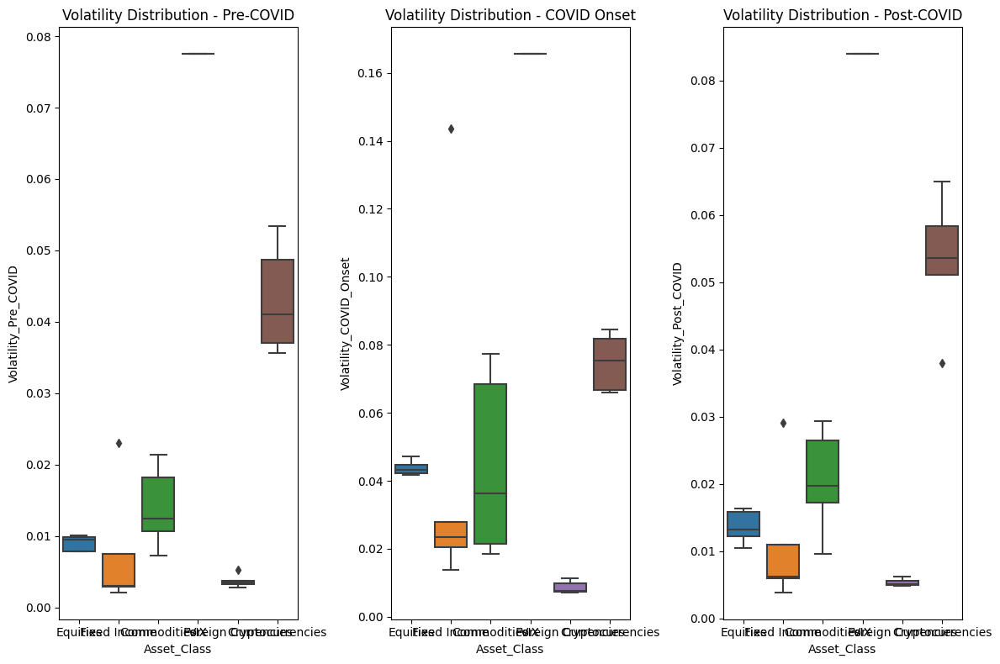

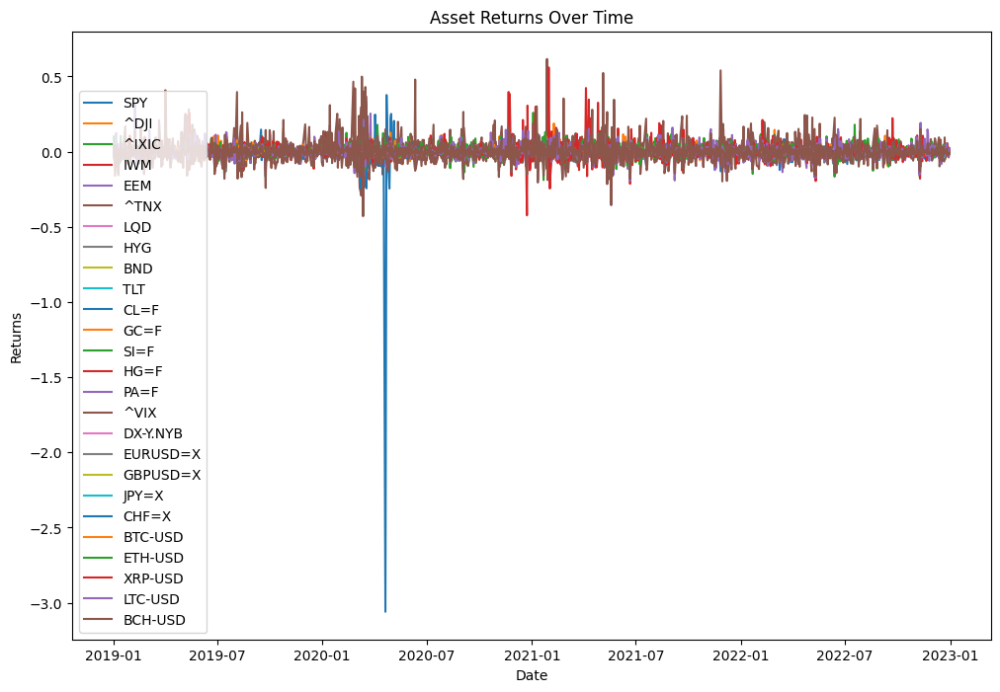

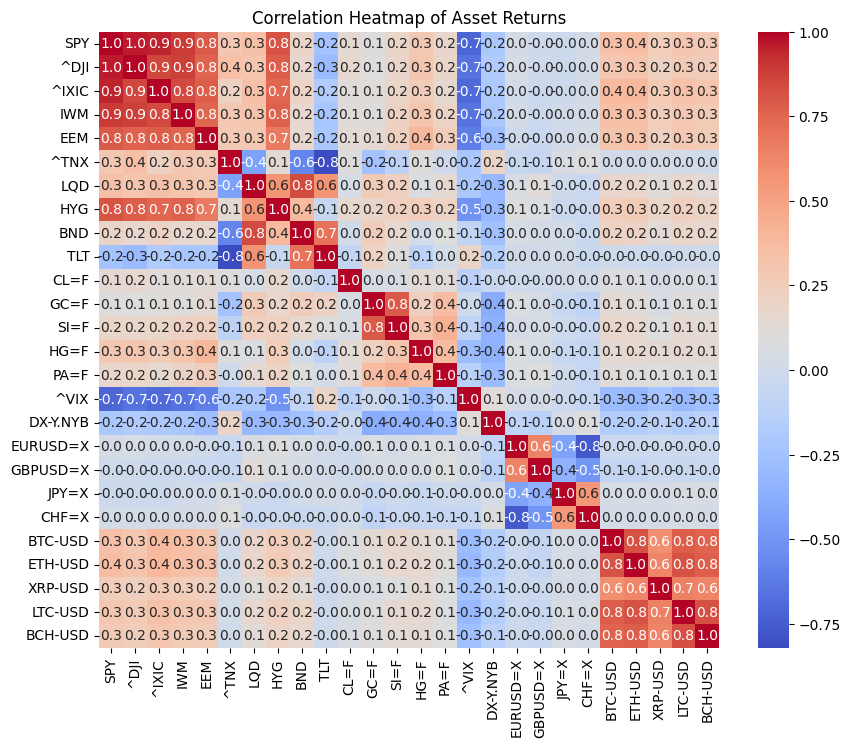

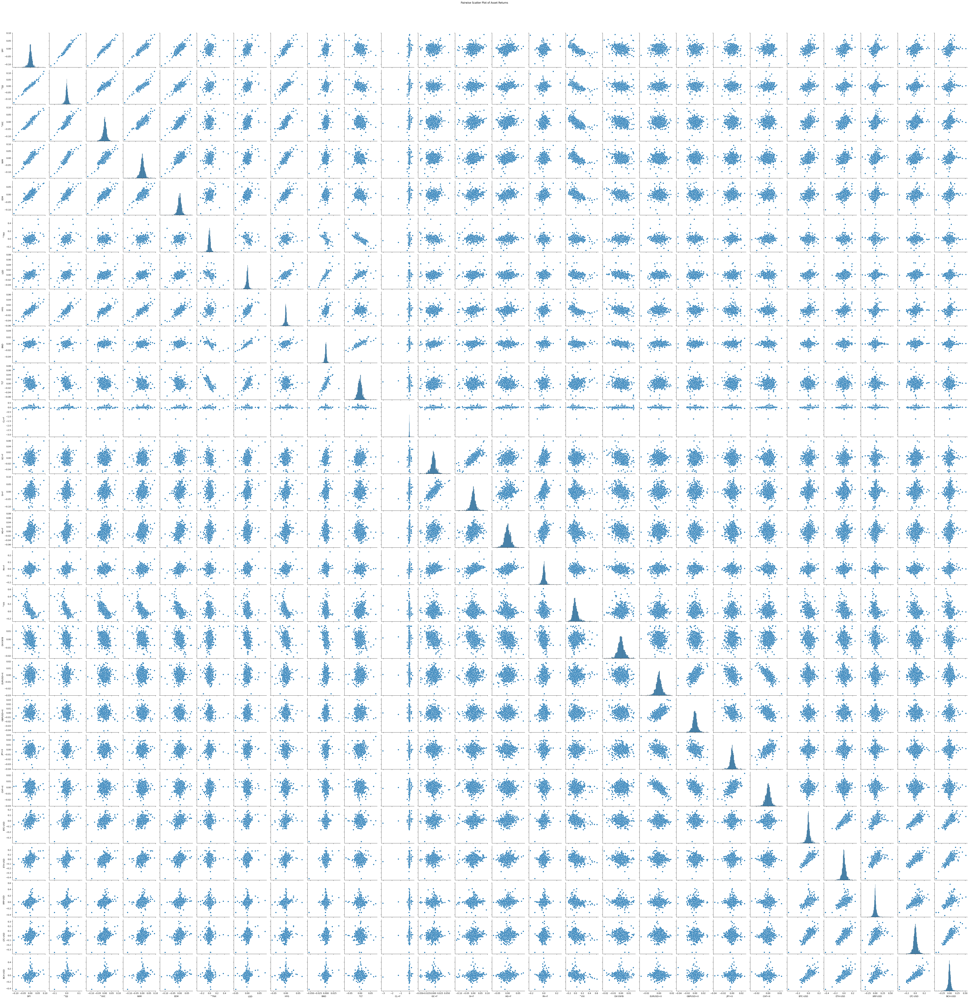

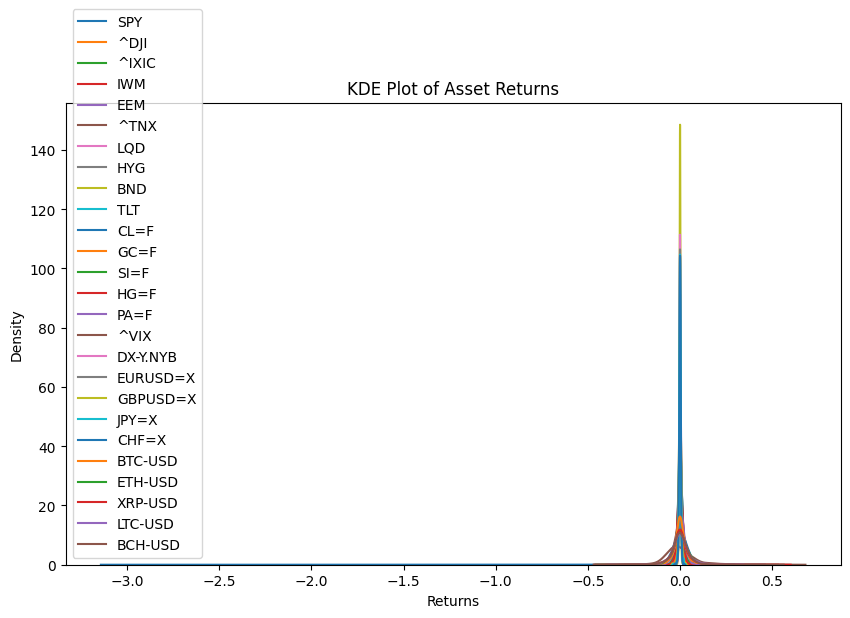

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have the 'comparative_volatility' DataFrame from the previous code

# Plotting boxplots to compare volatility across asset classes for each period
plt.figure(figsize=(12, 8))

# Pre-COVID volatility comparison
plt.subplot(1, 3, 1)
sns.boxplot(x='Asset_Class', y='Volatility_Pre_COVID', data=comparative_volatility)
plt.title('Volatility Distribution - Pre-COVID')

# COVID Onset volatility comparison
plt.subplot(1, 3, 2)
sns.boxplot(x='Asset_Class', y='Volatility_COVID_Onset', data=comparative_volatility)
plt.title('Volatility Distribution - COVID Onset')

# Post-COVID volatility comparison
plt.subplot(1, 3, 3)
sns.boxplot(x='Asset_Class', y='Volatility_Post_COVID', data=comparative_volatility)
plt.title('Volatility Distribution - Post-COVID')

plt.tight_layout()
plt.show()


# Plotting time series of asset returns for each asset
plt.figure(figsize=(12, 8))

for asset, data in data_dict.items():
    plt.plot(data.index, data['Return'], label=asset)

plt.title('Asset Returns Over Time')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()


# Calculate correlation matrix of asset returns
returns_df = pd.DataFrame({asset: data['Return'] for asset, data in data_dict.items()})
correlation_matrix = returns_df.corr()

# Plotting heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.0001f')
plt.title('Correlation Heatmap of Asset Returns')
plt.show()


# Pairwise scatter plot of asset returns
sns.pairplot(returns_df)
plt.suptitle('Pairwise Scatter Plot of Asset Returns', y=1.02)
plt.show()


# KDE plots for return distributions of assets
plt.figure(figsize=(10, 6))

for asset, data in data_dict.items():
    sns.kdeplot(data['Return'], label=asset)

plt.title('KDE Plot of Asset Returns')
plt.xlabel('Returns')
plt.ylabel('Density')
plt.legend()
plt.show()


###Vector Autoregressive Models/ ARCH Models

#####A VAR model could be useful for modeling the interdependencies and relationships between different asset classes. For example, we could build a VAR model with the equities, fixed income, and commodities datasets to analyze how shocks propagate across them.

#####The model would take the following general form:

#####yt = A1yt-1 + A2yt-2 + ... + Apyt-p + c + εt

#####where yt is a vector containing the time series for each asset class at time t, A1...Ap are coefficient matrices, c is a vector of constants, and εt is the error term.

#####We would fit this model on historical data, analyze the impulse response functions, and forecast future values. This would shed light on the lead-lag relationships and spillovers between the asset classes.

#####equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"] fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"] vix = ["^VIX"] commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"] foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"] cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

[*********************100%%**********************]  26 of 26 completed


/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:351: RuntimeWarning:

invalid value encountered in log

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 10, Dec, 2023
Time:                     20:16:11
--------------------------------------------------------------------
No. of Equations:         26.0000    BIC:                   -175.163
Nobs:                     378.000    HQIC:                  -226.256
Log likelihood:           43309.6    FPE:               1.34024e-105
AIC:                     -259.878    Det(Omega_mle):    2.06796e-112
--------------------------------------------------------------------
Results for equation SPY
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.000666         0.001663            0.400           0.689
L1.SPY              -0.358635         0.974299           -0.368           0.713
L1.^DJI              0.316668         0.524346            0.604   

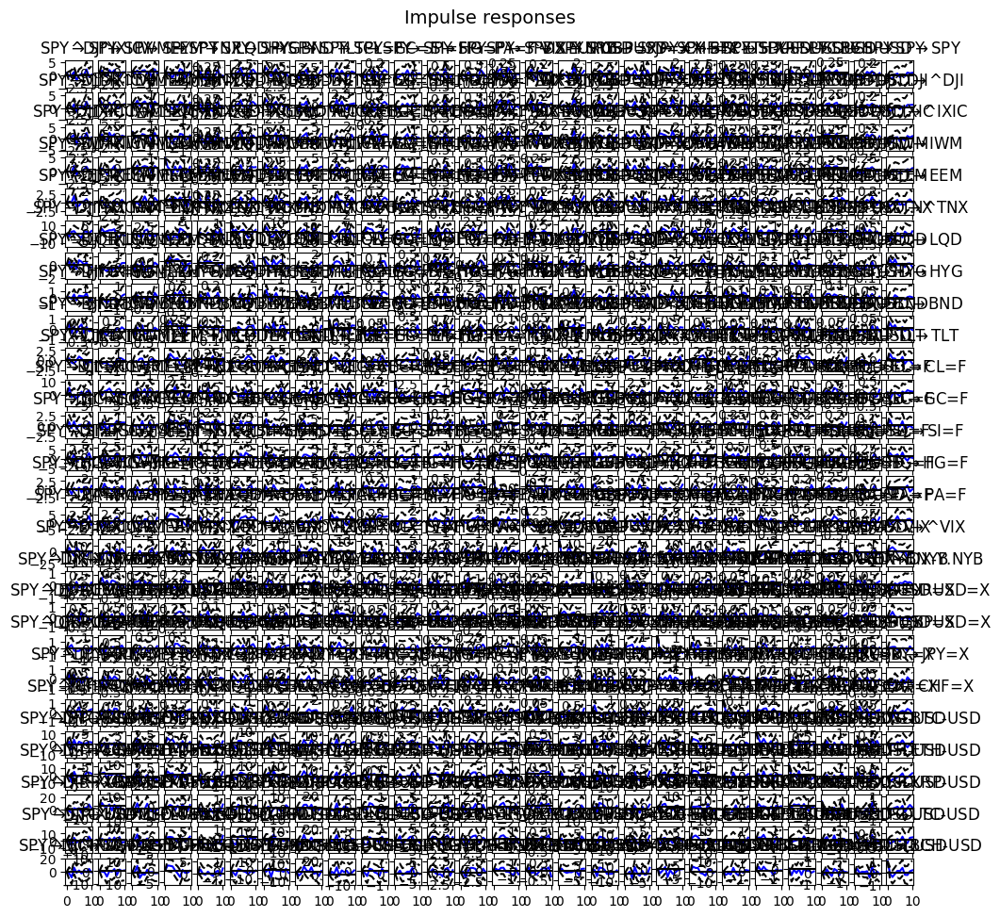

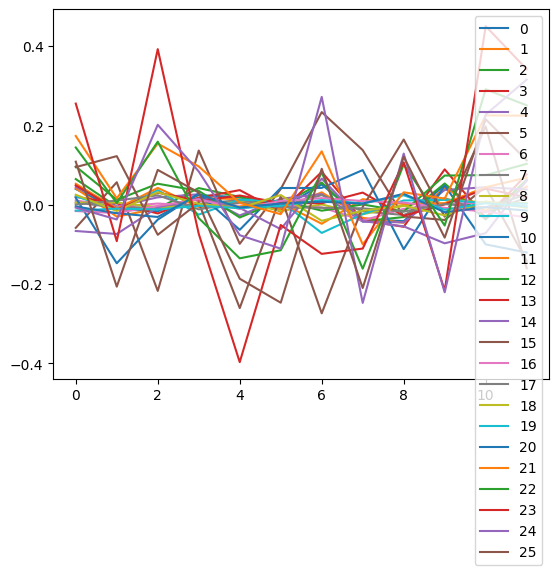

In [ ]:

# Define a list of assets in each category
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]
vix = ["^VIX"]
foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"]
cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

# Download data for equities, fixed income, and commodities for the specified period
assets = equities + fixed_income + commodities + vix + foreign_currencies + cryptocurrencies
data = yf.download(assets, start="2019-01-01", end="2020-12-31")['Adj Close']

# Take log returns for each asset
returns = np.log(data / data.shift(1)).dropna()

# Split the data into individual categories
equities_data = returns[equities]
fixed_income_data = returns[fixed_income]
commodities_data = returns[commodities]
vix_data = returns[vix]
foreign_currencies_data = returns[foreign_currencies]
cryptocurrencies_data = returns[cryptocurrencies]

# Combine all categories into a single DataFrame
data = pd.concat([equities_data, fixed_income_data, commodities_data, vix_data, foreign_currencies_data, cryptocurrencies_data], axis=1)

# Fit VAR model
model = VAR(data)
results = model.fit(maxlags=12,ic='aic')

# Print model summary
print(results.summary())

# Plotting impulse response functions
irf = results.irf(10)
irf.plot()

# Forecasting next 12 steps and plot predictions
# last_observation = data.values[-1:].reshape(1, -1)
forecast = results.forecast(data.values[-12:], steps=12)
pd.DataFrame(forecast).plot()

plt.show()


[*********************100%%**********************]  15 of 15 completed


/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:351: RuntimeWarning:

invalid value encountered in log

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 10, Dec, 2023
Time:                     20:33:03
--------------------------------------------------------------------
No. of Equations:         15.0000    BIC:                   -135.466
Nobs:                     494.000    HQIC:                  -141.356
Log likelihood:           26481.1    FPE:                9.37941e-64
AIC:                     -145.164    Det(Omega_mle):     1.09637e-64
--------------------------------------------------------------------
Results for equation SPY
              coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------
const            0.000813         0.000622            1.307           0.191
L1.SPY           0.416899         0.408907            1.020           0.308
L1.^DJI         -0.451752         0.241633           -1.870           0.062
L1.^IX

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



[[ 0.00054116 -0.00070744  0.00136449  0.00167715  0.00111094  0.01667499
  -0.00324752  0.00071989 -0.00118831 -0.00250096  0.00573119 -0.00083999
  -0.00408058  0.00403556  0.00354285]
 [ 0.00691366  0.00587583  0.00629943  0.00964732  0.00332646  0.04035081
   0.00059614  0.00106781  0.0001541  -0.00536831  0.00488428  0.00121539
   0.00552304  0.0026506  -0.00471668]]


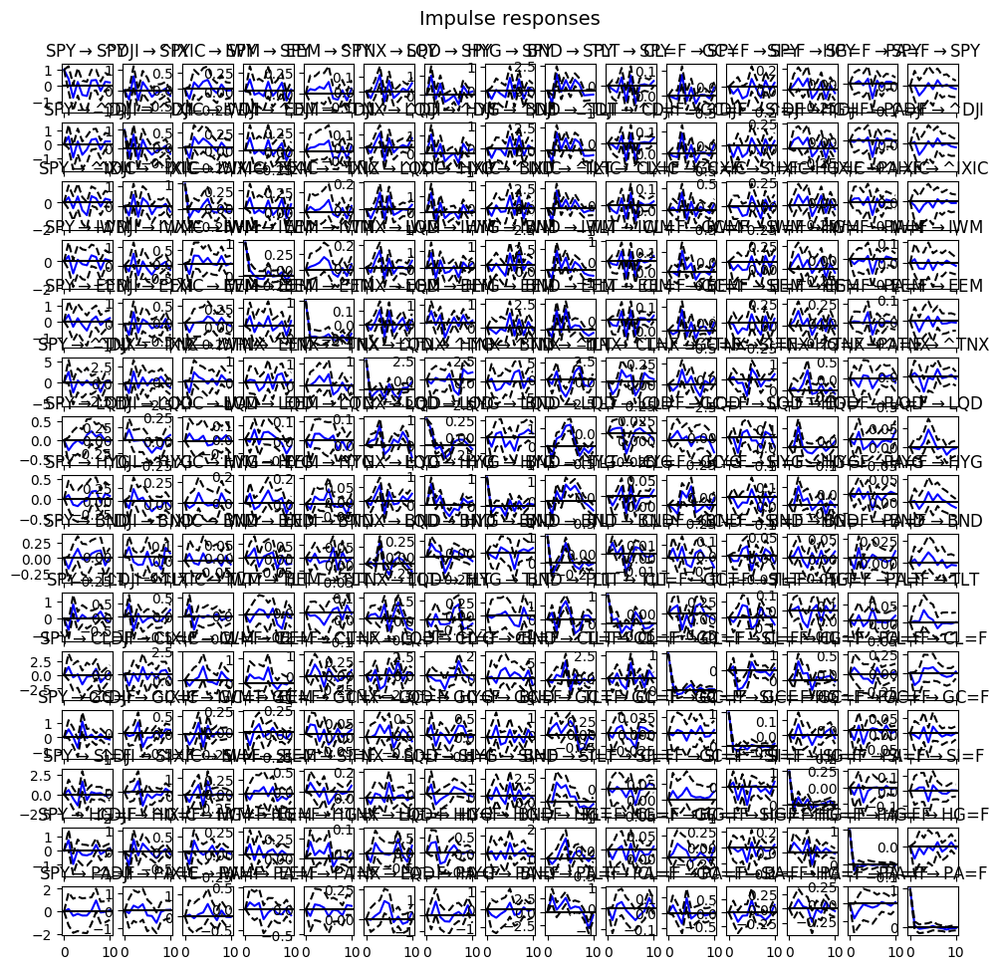

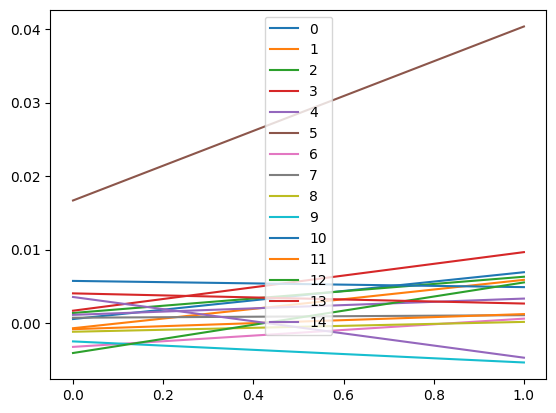

In [ ]:


# Define a list of assets in each category
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]

# Download data for equities, fixed income, and commodities for the specified period
assets = equities + fixed_income + commodities
data = yf.download(assets, start="2019-01-01", end="2020-12-31")['Adj Close']

# Take log returns for each asset
returns = np.log(data / data.shift(1)).dropna()

# Split the data into individual categories
equities_data = returns[equities]
fixed_income_data = returns[fixed_income]
commodities_data = returns[commodities]

# Combine all categories into a single DataFrame
data = pd.concat([equities_data, fixed_income_data, commodities_data], axis=1)

# Fit VAR model
model = VAR(data)
results = model.fit(maxlags=5)

# Print model summary
print(results.summary())

# Plotting impulse response functions
irf = results.irf(10)
irf.plot()

# Fit VAR model (assuming 'data' contains sufficient historical observations)
model = VAR(data)
results = model.fit(maxlags=5, ic='aic')

# Forecasting fewer steps (e.g., 2 steps)
# last_observation = data.values[-5:]
forecast = results.forecast(data.values, steps=2)
print(forecast)
pd.DataFrame(forecast).plot()



# # Forecasting next 3 steps and plot predictions
# last_observation = data.values[-1:].reshape(1, -1)
# forecast = results.forecast(last_observation, steps=3)
# pd.DataFrame(forecast).plot()

plt.show()


In [ ]:
# Define a list of assets in each category
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]
vix = ["^VIX"]
foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"]
cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

# Download data for equities, fixed income, and commodities for the specified period
assets = equities + fixed_income + commodities + vix + foreign_currencies + cryptocurrencies
data = yf.download(assets, start="2018-01-01", end="2022-12-31")['Adj Close']

# # # Replace any NaN or inf values with zero
# # data = data.fillna(0)

# # Drop rows with NaN or infinite values
# data = data.dropna()  # Drop rows with NaN
# data = data.replace([np.inf, -np.inf], np.nan).dropna(axis=0)  # Drop rows with infinite values

[*********************100%%**********************]  26 of 26 completed


In [ ]:
# Define a function to calculate the log returns of the assets
def log_return(data):
  return np.log(data / data.shift(1))

# Define a function to split the data into pre-covid, covid, and post-covid periods
def split_data(data, start, end):
  return data.loc[start:end]

# Define a function to plot the log returns of the assets
def plot_log_return(data, title):
  data.plot(figsize=(12,8), title=title)
  plt.xlabel('Date')
  plt.ylabel('Log Return')
  plt.show()

# Define a function to fit an ARCH model to the log returns of an asset
def fit_arch(data, asset):
  bic_arch = []
  for p in range(1, 12):
    arch = arch_model(data[asset], mean='Constant', vol='ARCH', p=p).fit(disp='off')
    bic_arch.append(arch.bic)
    if arch.bic == np.min(bic_arch):
      best_param = p
  model=arch_model(data[asset], mean='Constant', vol='ARCH', p=best_param)
  result = model.fit()
  print(result.summary())
  result.plot(annualize='D')
  plt.show()
  mse = np.mean(result.resid ** 2)
  print("MSE:", mse)
  annualized_expected_return = result.forecast().mean() * 252  # Assuming 252 trading days
annualized_volatility = result.forecast_volatility * np.sqrt(252)  # Adjust attribute name if needed
sharpe_ratio = annualized_expected_return / annualized_volatility
print("Sharpe ratio:", sharpe_ratio)

# Define a function to fit a VAR model to the log returns of multiple assets
def fit_var(data, assets, lags):
  model = VAR(data[assets])
  result = model.fit(maxlags=lags, ic='aic')
  print(result.summary())
  result.plot()
  plt.show()
  mse = np.mean(result.resid ** 2)
  print("MSE:", mse)
  annualized_expected_return = result.forecast * 252  # Assuming 252 trading days
  annualized_volatility = result.forecast_volatility * np.sqrt(252)
  sharpe_ratio = annualized_expected_return / annualized_volatility
  print("Sharpe ratio:", sharpe_ratio)

# Define a function to fit an ARIMA model to the log returns of an asset
def fit_arima(data, asset, order):
  model = ARIMA(data[asset], order=order)
  result = model.fit()
  print(result.summary())
  result.plot_diagnostics()
  plt.show()
  mse = np.mean(result.resid ** 2)
  print("MSE:", mse)
  annualized_expected_return = result.forecast * 252  # Assuming 252 trading days
  annualized_volatility = result.forecast_volatility * np.sqrt(252)
  sharpe_ratio = annualized_expected_return / annualized_volatility
  print("Sharpe ratio:", sharpe_ratio)

# Define a function to predict the log returns of an asset using XGBoost
def predict_xgb(data, asset, features):
  X = data[features]
  y = data[asset]

  train_size = int(len(X) * 0.8)
  X_train = X.iloc[:train_size]
  y_train = y.iloc[:train_size]
  X_test = X.iloc[train_size:]
  y_test = y.iloc[train_size:]

  param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6, 7],
    'colsample_bytree': [0.3, 0.5, 0.7, 1],
    'gamma': [0, 0.1, 0.2]
    }
  model = XGBRegressor()
  grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2)
  grid_search.fit(X_train, y_train)
  print("Best Parameters: ", grid_search.best_params_)
  print("Best Score: ", np.sqrt(-grid_search.best_score_))

  model = XGBRegressor(**grid_search.best_params_)
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  y_pred_series = pd.Series(y_pred, index=y_test.index)
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  print('RMSE: %.4f' % rmse)
  returns = y_test - y_pred
  avg_return = np.mean(returns)
  std_dev = np.std(returns)
  sharpe_ratio = avg_return / std_dev
  print('Sharp Ratio: %.4f' % sharpe_ratio)
  plt.plot(y_test, label='Actual')
  plt.plot(y_pred_series, label='Predicted')
  plt.legend()
  plt.title('XGBoost Prediction of ' + asset)
  plt.xlabel('Date')
  plt.ylabel('Log Return')
  plt.show()

# Define a function to predict the log returns of an asset using Neural Network
def predict_nn(data, asset, features):
  X = data[features]
  y = data[asset]
  train_size = int(len(X) * 0.8)
  X_train = X.iloc[:train_size]
  y_train = y.iloc[:train_size]
  X_test = X.iloc[train_size:]
  y_test = y.iloc[train_size:]
  param_grid = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant', 'adaptive'],
    }
  model = MLPRegressor(max_iter=1000)
  grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=0, n_jobs=-1)
  grid_search.fit(X_train, y_train)
  print("Best Parameters: ", grid_search.best_params_)
  print("Best Score: ", np.sqrt(-grid_search.best_score_))
  model = MLPRegressor(hidden_layer_sizes=grid_search.best_params_['hidden_layer_sizes'], activation=grid_search.best_params_['activation'], solver=grid_search.best_params_['solver'], alpha=grid_search.best_params_['alpha'], learning_rate=grid_search.best_params_['learning_rate'], max_iter=1000)
  model.fit(X_train, y_train)

  y_pred = model.predict(X_test)
  y_pred_series = pd.Series(y_pred, index=y_test.index)
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  print('RMSE: %.4f' % rmse)
  returns = y_test - y_pred
  avg_return = np.mean(returns)
  std_dev = np.std(returns)
  sharpe_ratio = avg_return / std_dev
  print('Sharp Ratio: %.4f' % sharpe_ratio)
  plt.plot(y_test, label='Actual')
  plt.plot(y_pred_series, label='Predicted')
  plt.legend()
  plt.title('Neural Network Prediction of ' + asset)
  plt.xlabel('Date')
  plt.ylabel('Log Return')
  plt.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:351: RuntimeWarning:

invalid value encountered in log



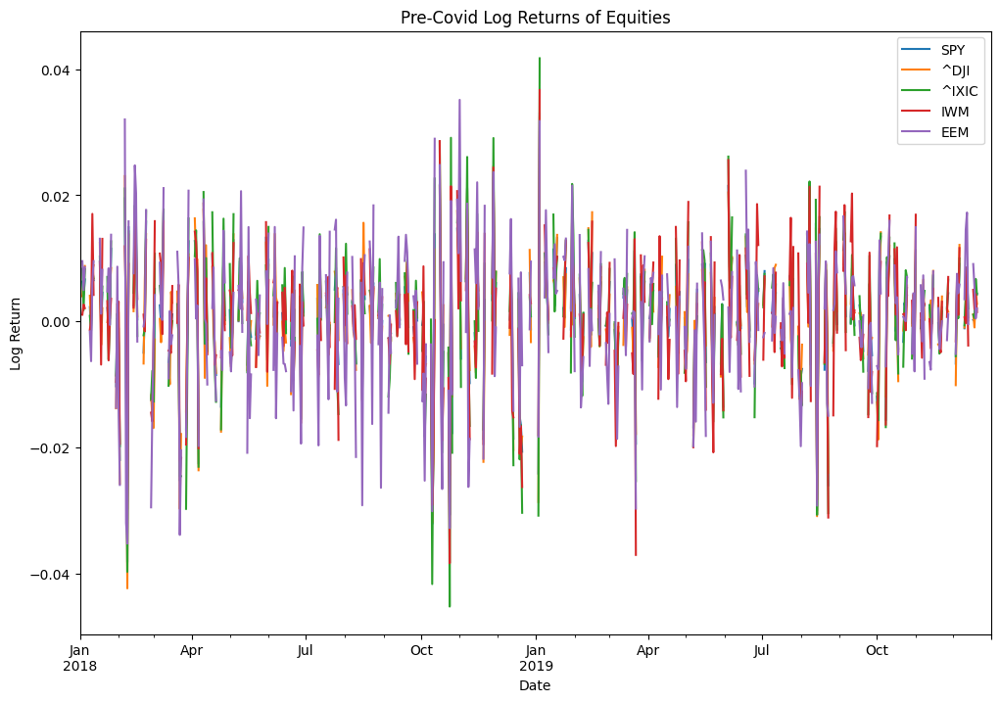

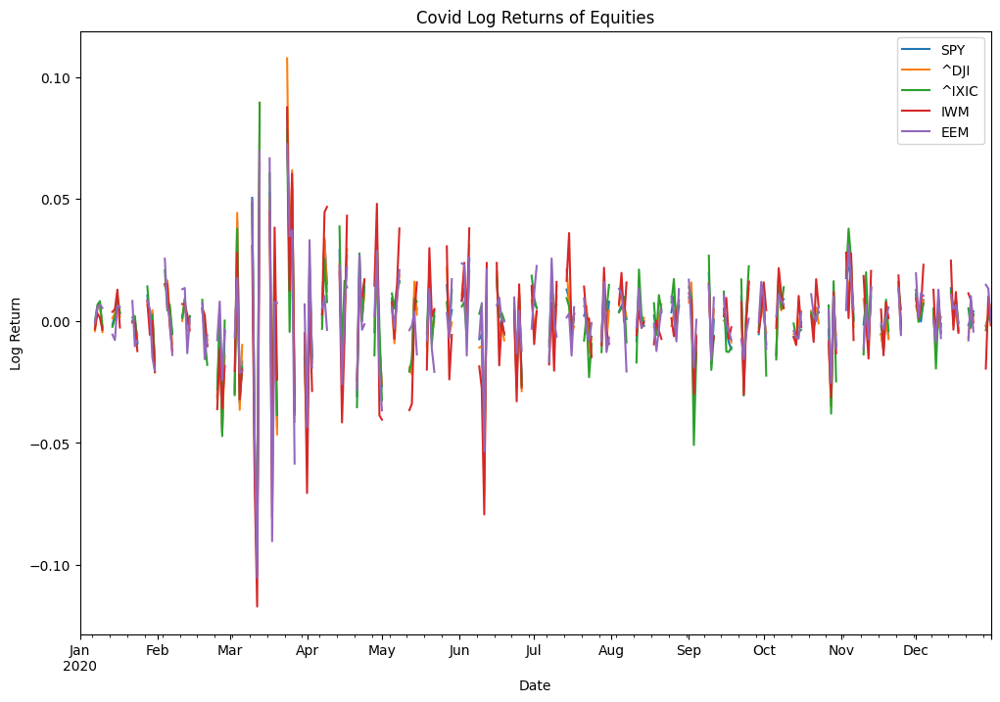

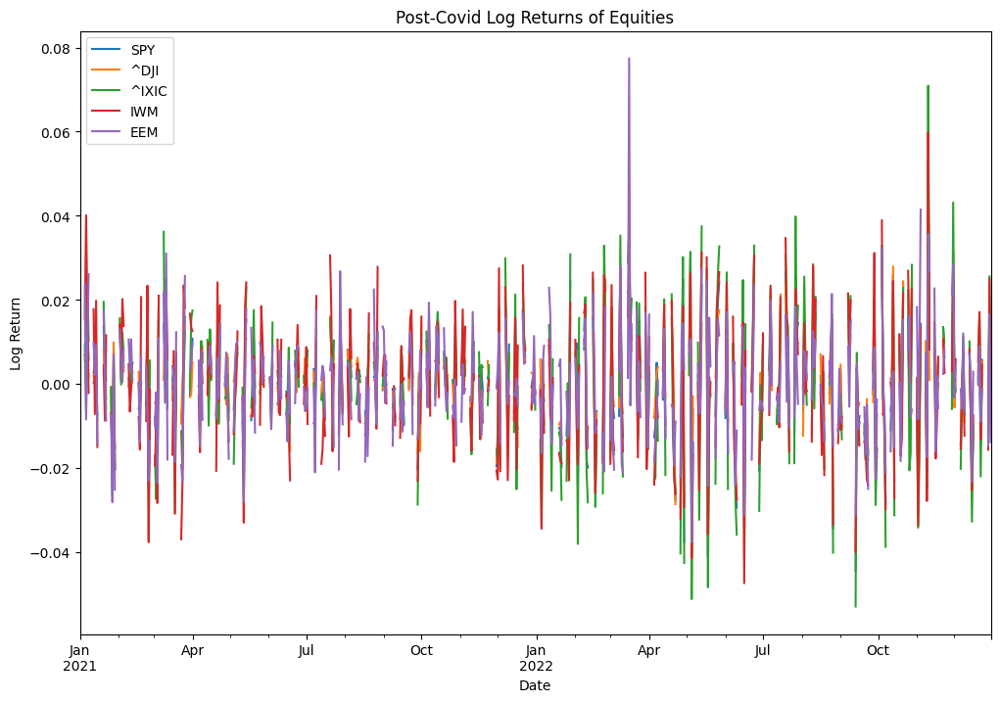

In [ ]:
# Calculate the log returns of the data
log_data = log_return(data)

# Split the data into pre-covid, covid, and post-covid periods
pre_covid_data = split_data(log_data, '2018-01-01', '2019-12-31')
covid_data = split_data(log_data, '2020-01-01', '2020-12-31')
post_covid_data = split_data(log_data, '2021-01-01', '2022-12-31')

# Plot the log returns of the equities
plot_log_return(pre_covid_data[equities], 'Pre-Covid Log Returns of Equities')
plot_log_return(covid_data[equities], 'Covid Log Returns of Equities')
plot_log_return(post_covid_data[equities], 'Post-Covid Log Returns of Equities')


In [ ]:
!pip install pmdarima
from pmdarima import auto_arima

# Assume 'ts' is your time series data
model = auto_arima(100*pre_covid_data.fillna(method='bfill')['SPY'], trace=True, error_action='ignore', suppress_warnings=True)
model.fit(100*pre_covid_data.fillna(method='bfill')['SPY'])

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1739.364, Time=2.10 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1924.603, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1750.330, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1798.137, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1927.665, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1742.923, Time=0.58 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1745.637, Time=0.84 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1740.090, Time=3.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1741.712, Time=2.15 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1745.577, Time=0.58 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=1740.635, Time=1.31 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1741.102, Time=2.18 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=1742.506, Time=1.97 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1739.648, Time=0.65 sec

Best model:  ARIMA(2,0,2)(0,0,0)

ARIMA(order=(2, 0, 2), scoring_args={}, suppress_warnings=True)

Iteration:      1,   Func. Count:     12,   Neg. LLF: 4466.184221007494
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1782.3240618169411
Iteration:      3,   Func. Count:     41,   Neg. LLF: 21621.47415886529
Iteration:      4,   Func. Count:     53,   Neg. LLF: 23609.526485707327
Iteration:      5,   Func. Count:     65,   Neg. LLF: 1409.0549560899958
Iteration:      6,   Func. Count:     77,   Neg. LLF: 881.6875398134467
Iteration:      7,   Func. Count:     90,   Neg. LLF: 1008.5708003089507
Iteration:      8,   Func. Count:    102,   Neg. LLF: 1039.9319410955586
Iteration:      9,   Func. Count:    114,   Neg. LLF: 1188.6568732443143
Iteration:     10,   Func. Count:    126,   Neg. LLF: 825.2921188559338
Iteration:     11,   Func. Count:    138,   Neg. LLF: 806.7781292906028
Iteration:     12,   Func. Count:    150,   Neg. LLF: 807.6736474135037
Iteration:     13,   Func. Count:    162,   Neg. LLF: 801.6696506739854
Iteration:     14,   Func. Count:    174,   Neg. LLF: 938.

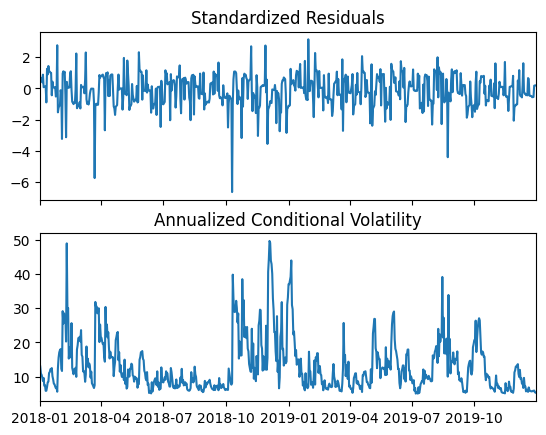

MSE: 0.8233639129126202
Sharpe ratio:                   h.1
Date                 
2019-12-31  26.164503
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1351.1123207918276
Iteration:      2,   Func. Count:     15,   Neg. LLF: 945.5021867747241
Iteration:      3,   Func. Count:     23,   Neg. LLF: 658.1872440889067
Iteration:      4,   Func. Count:     29,   Neg. LLF: 604.8397009276918
Iteration:      5,   Func. Count:     34,   Neg. LLF: 656.8264723906492
Iteration:      6,   Func. Count:     40,   Neg. LLF: 604.7748084867917
Iteration:      7,   Func. Count:     45,   Neg. LLF: 604.7746199300723
Iteration:      8,   Func. Count:     49,   Neg. LLF: 604.7746199300807
Optimization terminated successfully    (Exit mode 0)
            Current function value: 604.7746199300723
            Iterations: 8
            Function evaluations: 49
            Gradient evaluations: 8
                      Constant Mean - ARCH Model Results                      
Dep. Variable:                   

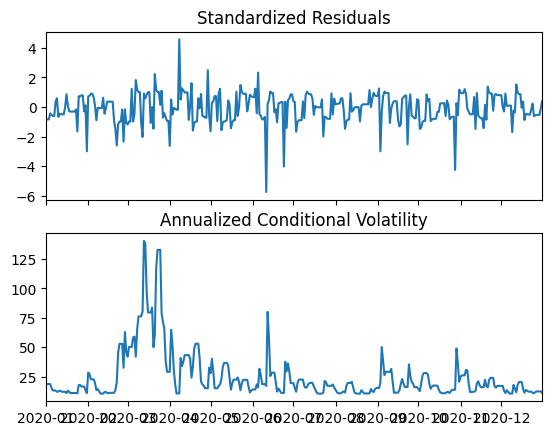

MSE: 3.826990621745387
Sharpe ratio:                  h.1
Date                
2020-12-31  7.414511
Iteration:      1,   Func. Count:     12,   Neg. LLF: 3878.5914427641214
Iteration:      2,   Func. Count:     27,   Neg. LLF: 1331.9406899876826
Iteration:      3,   Func. Count:     40,   Neg. LLF: 142158.18894976837
Iteration:      4,   Func. Count:     52,   Neg. LLF: 2184.667397220409
Iteration:      5,   Func. Count:     64,   Neg. LLF: 1303683.3528412562
Iteration:      6,   Func. Count:     76,   Neg. LLF: 71840.80023288244
Iteration:      7,   Func. Count:     88,   Neg. LLF: 1157.9672486633044
Iteration:      8,   Func. Count:    100,   Neg. LLF: 1190.223896507044
Iteration:      9,   Func. Count:    112,   Neg. LLF: 1080.9267132255802
Iteration:     10,   Func. Count:    124,   Neg. LLF: 1048.6670981566158
Iteration:     11,   Func. Count:    136,   Neg. LLF: 1041.8169532925012
Iteration:     12,   Func. Count:    148,   Neg. LLF: 1060.505697212971
Iteration:     13,   Func. C

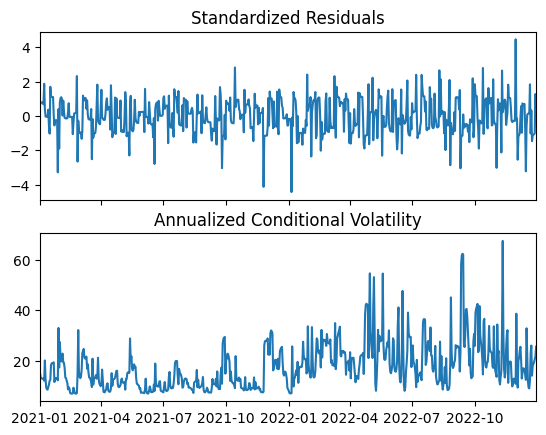

MSE: 1.4324922840427672
Sharpe ratio:                  h.1
Date                
2022-12-30  0.984911
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Thu, 21, Dec, 2023
Time:                     15:39:37
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                  -0.766838
Nobs:                     728.000    HQIC:                 -0.848158
Log likelihood:          -2750.63    FPE:                   0.406875
AIC:                    -0.899251    Det(Omega_mle):        0.395360
--------------------------------------------------------------------
Results for equation SPY
             coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------
const           0.034257         0.029799            1.150           0.250
L1.SPY          0.461577         0.039448           11.701  

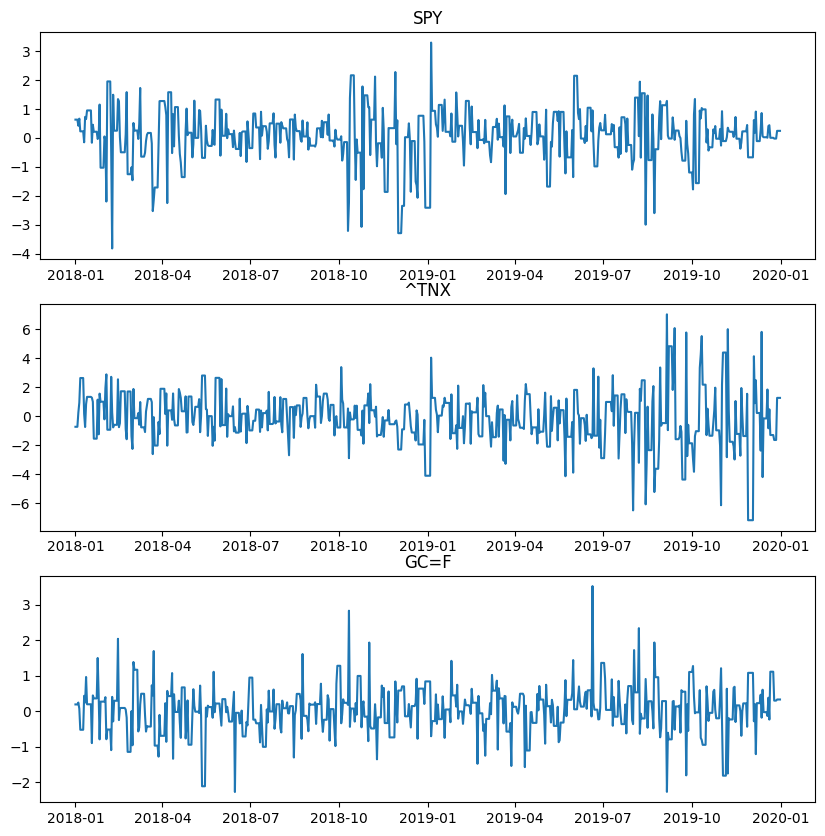

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3430: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'



MSE: SPY     0.620796
^TNX    2.556563
GC=F    0.346815
dtype: float64


TypeError: ignored

In [ ]:
fit_arch(100*pre_covid_data.fillna(method='bfill'), 'SPY')
fit_arch(100*covid_data.fillna(method='bfill'), 'SPY')
fit_arch(100*post_covid_data.fillna(method='bfill'), 'SPY')

fit_var(100*pre_covid_data.fillna(method='bfill'), ['SPY', '^TNX', 'GC=F'], 5)
fit_var(100*covid_data.fillna(method='bfill'), ['SPY', '^TNX', 'GC=F'], 5)
fit_var(100*post_covid_data.fillna(method='bfill'), ['SPY', '^TNX', 'GC=F'], 5)

fit_arima(100*pre_covid_data.fillna(method='bfill'), 'SPY', (2,0,2))
fit_arima(100*covid_data.fillna(method='bfill'), 'SPY', (2,0,2))
fit_arima(100*post_covid_data.fillna(method='bfill'), 'SPY', (2,0,2))




predict_xgb(log_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])
predict_nn(log_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])

predict_xgb(pre_covid_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])
predict_nn(pre_covid_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])
predict_xgb(covid_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])
predict_nn(covid_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])
predict_xgb(post_covid_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])
predict_nn(post_covid_data.fillna(method='bfill'), 'SPY', ['^TNX', 'GC=F'])

In [ ]:
# Check for NaN and inf values in the data
nan_values = data.isnull().sum()
inf_values = data.isin([np.nan, np.inf, -np.inf]).sum()

In [ ]:
# Print columns with NaN values
print("Columns with NaN values:")
print(nan_values[nan_values > 0])

# Print columns with infinite values
print("\nColumns with infinite values:")
print(inf_values[inf_values > 0])

Columns with NaN values:
BND         566
CHF=X       521
CL=F        566
DX-Y.NYB    566
EEM         566
EURUSD=X    521
GBPUSD=X    521
GC=F        567
HG=F        567
HYG         566
IWM         566
JPY=X       521
LQD         566
PA=F        582
SI=F        567
SPY         566
TLT         566
^DJI        566
^IXIC       566
^TNX        566
^VIX        566
dtype: int64

Columns with infinite values:
BND         566
CHF=X       521
CL=F        566
DX-Y.NYB    566
EEM         566
EURUSD=X    521
GBPUSD=X    521
GC=F        567
HG=F        567
HYG         566
IWM         566
JPY=X       521
LQD         566
PA=F        582
SI=F        567
SPY         566
TLT         566
^DJI        566
^IXIC       566
^TNX        566
^VIX        566
dtype: int64


In [ ]:
# Drop rows with NaN or infinite values
clean_data = data.dropna()  # Drop rows with NaN
data = clean_data.replace([np.inf, -np.inf], np.nan).dropna(axis=0)  # Drop rows with infinite values

In [ ]:
# Check for NaN and infinite values in the 'SPY' column
spy_column = pre_covid_data['SPY']
nan_values = spy_column.isnull().sum()
inf_values = np.isinf(spy_column).sum()

# Print the number of NaN and infinite values
print("Number of NaN values in 'SPY' column:", nan_values)
print("Number of infinite values in 'SPY' column:", inf_values)

# Handle NaN and infinite values in 'SPY' column
clean_spy_column = spy_column.dropna()  # Remove rows with NaN values
clean_spy_column = clean_spy_column.replace([np.inf, -np.inf], np.nan).dropna()  # Remove rows with infinite values

# Now use clean_spy_column to fit the ARCH model
model = arch_model(clean_spy_column, mean='Constant', vol='ARCH', p=5)
result = model.fit()
print(result.summary())


Number of NaN values in 'SPY' column: 340
Number of infinite values in 'SPY' column: 0
Iteration:      1,   Func. Count:      9,   Neg. LLF: 189868951531.94025
Iteration:      2,   Func. Count:     24,   Neg. LLF: 49188292680.83799
Iteration:      3,   Func. Count:     39,   Neg. LLF: 395185.9887429549
Iteration:      4,   Func. Count:     53,   Neg. LLF: 21891.161399015677
Iteration:      5,   Func. Count:     67,   Neg. LLF: 31921110.679957334
Iteration:      6,   Func. Count:     82,   Neg. LLF: 241471.4598738827
Iteration:      7,   Func. Count:     97,   Neg. LLF: 3529316.910067141
Iteration:      8,   Func. Count:    112,   Neg. LLF: 59054.724736456876
Iteration:      9,   Func. Count:    127,   Neg. LLF: 17429.58914075911
Iteration:     10,   Func. Count:    141,   Neg. LLF: 540395.5723151306
Iteration:     11,   Func. Count:    156,   Neg. LLF: 741544.9034619565
Iteration:     12,   Func. Count:    171,   Neg. LLF: 384575.1636975187
Optimization terminated successfully    (Exit

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 8.079e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [ ]:
# Check for NaN and infinite values in the 'SPY' column
spy_column = covid_data['SPY']
nan_values = spy_column.isnull().sum()
inf_values = np.isinf(spy_column).sum()

# Print the number of NaN and infinite values
print("Number of NaN values in 'SPY' column:", nan_values)
print("Number of infinite values in 'SPY' column:", inf_values)

# Handle NaN and infinite values in 'SPY' column
clean_spy_column = spy_column.dropna()  # Remove rows with NaN values
clean_spy_column = clean_spy_column.replace([np.inf, -np.inf], np.nan).dropna()  # Remove rows with infinite values

# Now use clean_spy_column to fit the ARCH model
model = arch_model(clean_spy_column, mean='Constant', vol='ARCH', p=5)
result = model.fit()
print(result.summary())

Number of NaN values in 'SPY' column: 167
Number of infinite values in 'SPY' column: 0
Iteration:      1,   Func. Count:      9,   Neg. LLF: 662372976.4967486
Iteration:      2,   Func. Count:     23,   Neg. LLF: 326.708058205532
Iteration:      3,   Func. Count:     34,   Neg. LLF: -347.7675516489366
Iteration:      4,   Func. Count:     46,   Neg. LLF: 724.7530036140616
Iteration:      5,   Func. Count:     58,   Neg. LLF: -429.63198400391525
Iteration:      6,   Func. Count:     67,   Neg. LLF: -553.6688849967143
Iteration:      7,   Func. Count:     76,   Neg. LLF: -559.2355233204762
Iteration:      8,   Func. Count:     85,   Neg. LLF: -557.0791361204426


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0003918. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




Iteration:      9,   Func. Count:     94,   Neg. LLF: -564.4950051711846
Iteration:     10,   Func. Count:    103,   Neg. LLF: -540.1086469463493
Iteration:     11,   Func. Count:    112,   Neg. LLF: -565.975871966423
Iteration:     12,   Func. Count:    120,   Neg. LLF: -565.9945152986563
Iteration:     13,   Func. Count:    128,   Neg. LLF: -565.9963851753218
Iteration:     14,   Func. Count:    136,   Neg. LLF: -565.9967935165398
Iteration:     15,   Func. Count:    144,   Neg. LLF: -565.9967988457936
Iteration:     16,   Func. Count:    151,   Neg. LLF: -565.9967988457508
Optimization terminated successfully    (Exit mode 0)
            Current function value: -565.9967988457936
            Iterations: 16
            Function evaluations: 151
            Gradient evaluations: 16
                      Constant Mean - ARCH Model Results                      
Dep. Variable:                    SPY   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-s

In [ ]:
# Check for NaN and infinite values in the 'SPY' column
spy_column = post_covid_data['SPY']
nan_values = spy_column.isnull().sum()
inf_values = np.isinf(spy_column).sum()

# Print the number of NaN and infinite values
print("Number of NaN values in 'SPY' column:", nan_values)
print("Number of infinite values in 'SPY' column:", inf_values)

# Handle NaN and infinite values in 'SPY' column
clean_spy_column = spy_column.dropna()  # Remove rows with NaN values
clean_spy_column = clean_spy_column.replace([np.inf, -np.inf], np.nan).dropna()  # Remove rows with infinite values

# Now use clean_spy_column to fit the ARCH model
model = arch_model(clean_spy_column, mean='Constant', vol='ARCH', p=5)
result = model.fit()
print(result.summary())

Number of NaN values in 'SPY' column: 332
Number of infinite values in 'SPY' column: 0
Iteration:      1,   Func. Count:      9,   Neg. LLF: 38598365244.18901
Iteration:      2,   Func. Count:     24,   Neg. LLF: 2189.1989350951117


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001559. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




Iteration:      3,   Func. Count:     37,   Neg. LLF: 237.20267885321448
Iteration:      4,   Func. Count:     49,   Neg. LLF: 74671183.16652983
Iteration:      5,   Func. Count:     64,   Neg. LLF: 2256.309168598137
Iteration:      6,   Func. Count:     77,   Neg. LLF: -434.7948959123215
Iteration:      7,   Func. Count:     88,   Neg. LLF: 4.758735291537483
Iteration:      8,   Func. Count:     99,   Neg. LLF: -275.3658217760184
Iteration:      9,   Func. Count:    108,   Neg. LLF: -343.6995705309979
Iteration:     10,   Func. Count:    117,   Neg. LLF: -1145.310865443163
Iteration:     11,   Func. Count:    127,   Neg. LLF: -1113.502638037616
Iteration:     12,   Func. Count:    136,   Neg. LLF: -1185.846760176857
Iteration:     13,   Func. Count:    145,   Neg. LLF: -1187.2874881427088
Iteration:     14,   Func. Count:    154,   Neg. LLF: -1194.9241327783006
Iteration:     15,   Func. Count:    164,   Neg. LLF: -1197.8495516680282
Iteration:     16,   Func. Count:    173,   Neg. LL

In [ ]:
equities = ["SPY", "^DJI", "^IXIC", "IWM", "EEM"]
fixed_income = ["^TNX", "LQD", "HYG", "BND", "TLT"]
commodities = ["CL=F", "GC=F", "SI=F", "HG=F", "PA=F"]
vix = ["^VIX"]
foreign_currencies = ["DX-Y.NYB", "EURUSD=X", "GBPUSD=X", "JPY=X", "CHF=X"]
cryptocurrencies = ["BTC-USD", "ETH-USD", "XRP-USD", "LTC-USD", "BCH-USD"]

assets = equities + fixed_income + commodities + vix + foreign_currencies + cryptocurrencies

data = yf.download(assets, start="2018-01-01", end="2022-12-31")['Adj Close']


[*********************100%%**********************]  26 of 26 completed


In [ ]:
# Assuming 'data' contains the required asset data
for asset in data.columns:
    returns = data[asset].pct_change().dropna()
    model = arch_model(returns, vol='Garch', p=1, q=1)
    results = model.fit()
    print(results.summary())


Iteration:      1,   Func. Count:      6,   Neg. LLF: 3050383.728237312
Iteration:      2,   Func. Count:     17,   Neg. LLF: 9182.4037157965
Iteration:      3,   Func. Count:     25,   Neg. LLF: 42963664.70837773
Iteration:      4,   Func. Count:     35,   Neg. LLF: 1845.696956435028
Iteration:      5,   Func. Count:     45,   Neg. LLF: 1694.6728300736072
Iteration:      6,   Func. Count:     54,   Neg. LLF: 434.0599341904549
Iteration:      7,   Func. Count:     62,   Neg. LLF: 18324.24493317015
Iteration:      8,   Func. Count:     70,   Neg. LLF: 5887.594301265028
Iteration:      9,   Func. Count:     77,   Neg. LLF: 13485537.551366638
Iteration:     10,   Func. Count:     87,   Neg. LLF: -2643.3592435423034
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2643.3592493594506
            Iterations: 14
            Function evaluations: 87
            Gradient evaluations: 10
                     Constant Mean - GARCH Model Results           

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.003691. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 9.927e-06. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 1000 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 247499741.14611256
Iteration:      2,   Func. Count:     18,   Neg. LLF: 2800.1518773484386
Iteration:      3,   Func. Count:     27,   Neg. LLF: 9122.936616946725
Iteration:      4,   Func. Count:     33,   Neg. LLF: -3227.2247976882113
Iteration:      5,   Func. Count:     39,   Neg. LLF: -2161.9012611922135
Iteration:      6,   Func. Count:     45,   Neg. LLF: 817744136.5652566
Iteration:      7,   Func. Count:     51,   Neg. LLF: -3390.0555854416316
Iteration:      8,   Func. Count:     57,   Neg. LLF: -3299.548666382182
Iteration:      9,   Func. Count:     64,   Neg. LLF: -3433.379032853335
Iteration:     10,   Func. Count:     69,   Neg. LLF: -3433.3813375763493
Iteration:     11,   Func. Count:     74,   Neg. LLF: -3433.3813270094056
Iteration:     12,   Func. Count:     81,   Neg. LLF: -3433.3813276277424
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3433.381339361941
           

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 1.421e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00682. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This

                     Constant Mean - GARCH Model Results                      
Dep. Variable:               DX-Y.NYB   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                7872.71
Distribution:                  Normal   AIC:                          -15737.4
Method:            Maximum Likelihood   BIC:                          -15715.4
                                        No. Observations:                 1823
Date:                Sun, Dec 10 2023   Df Residuals:                     1822
Time:                        00:27:19   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu         7.1701e-05  1.817e-06     39.464      0.000 [6.

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001483. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002501. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which 

Iteration:      1,   Func. Count:      6,   Neg. LLF: 458287468917.6659
Iteration:      2,   Func. Count:     19,   Neg. LLF: 1.7384163147283885e+21
Iteration:      3,   Func. Count:     34,   Neg. LLF: 1.918910046384509e+20
Iteration:      4,   Func. Count:     48,   Neg. LLF: 4438.810390618322
Inequality constraints incompatible    (Exit mode 4)
            Current function value: 4438.810522775345
            Iterations: 4
            Function evaluations: 48
            Gradient evaluations: 4
                     Constant Mean - GARCH Model Results                      
Dep. Variable:               EURUSD=X   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -4438.81
Distribution:                  Normal   AIC:                           8885.62
Method:            Maximum Likelihood   BIC:                           8907.66
                       

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 2.544e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 6.388e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

T

Iteration:      5,   Func. Count:     54,   Neg. LLF: -5497.522789058412
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5497.522790012477
            Iterations: 9
            Function evaluations: 54
            Gradient evaluations: 5
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   HG=F   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                5497.52
Distribution:                  Normal   AIC:                          -10987.0
Method:            Maximum Likelihood   BIC:                          -10965.0
                                        No. Observations:                 1823
Date:                Sun, Dec 10 2023   Df Residuals:                     1822
Time:                        00:27:20   Df Model:                            1
        

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 2.871e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.000191. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

Th

Iteration:      1,   Func. Count:      5,   Neg. LLF: -7669.231500869782
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -7669.2315152513675
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    LQD   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                7669.23
Distribution:                  Normal   AIC:                          -15330.5
Method:            Maximum Likelihood   BIC:                          -15308.4
                                        No. Observations:                 1823
Date:                Sun, Dec 10 2023   Df Residuals:                     1822
Time:                        00:27:20   Df Model:                            1
         

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002778. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0004802. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which 

Iteration:      2,   Func. Count:     18,   Neg. LLF: 5522408670479.064
Iteration:      3,   Func. Count:     33,   Neg. LLF: 3.651033777455144e+22
Iteration:      4,   Func. Count:     47,   Neg. LLF: -5122.928464473769
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5122.928460442088
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 4
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                   SI=F   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                5122.93
Distribution:                  Normal   AIC:                          -10237.9
Method:            Maximum Likelihood   BIC:                          -10215.8
                                        No. Observations:                 1823
Date:             

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001271. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 7.133e-05. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, whic

Iteration:      1,   Func. Count:      6,   Neg. LLF: 38885656.596164785
Iteration:      2,   Func. Count:     18,   Neg. LLF: 67049511.51843597
Iteration:      3,   Func. Count:     30,   Neg. LLF: 323531.01777476433
Iteration:      4,   Func. Count:     36,   Neg. LLF: 8848.579996521585
Iteration:      5,   Func. Count:     44,   Neg. LLF: -1126.8881697272718
Iteration:      6,   Func. Count:     54,   Neg. LLF: 908490.7428650256
Iteration:      7,   Func. Count:     65,   Neg. LLF: -1631.1523657851244
Iteration:      8,   Func. Count:     73,   Neg. LLF: 48148.239927675284
Iteration:      9,   Func. Count:     80,   Neg. LLF: 43736.399215282
Iteration:     10,   Func. Count:     87,   Neg. LLF: -1218.9831635695432
Iteration:     11,   Func. Count:     94,   Neg. LLF: -2585.4914073556038
Iteration:     12,   Func. Count:    100,   Neg. LLF: -145.3903986750008
Iteration:     13,   Func. Count:    107,   Neg. LLF: -2821.3823034077
Iteration:     14,   Func. Count:    112,   Neg. LLF: -

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.00013. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0001803. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which 

Iteration:      3,   Func. Count:     34,   Neg. LLF: 317914022149.058
Iteration:      4,   Func. Count:     49,   Neg. LLF: 299434447256.6339
Iteration:      5,   Func. Count:     63,   Neg. LLF: -5610.198498178834
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5610.198497349684
            Iterations: 9
            Function evaluations: 63
            Gradient evaluations: 5
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                  ^IXIC   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                5610.20
Distribution:                  Normal   AIC:                          -11212.4
Method:            Maximum Likelihood   BIC:                          -11190.4
                                        No. Observations:                 1823
Date:                Su

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.005913. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [ ]:
# VAR Model
# Assuming 'data' contains the required asset data
model_var = VAR(data.dropna())  # Remove NaN values if present
results_var = model_var.fit(maxlags=5)  # Adjust maxlags parameter as needed
print(results_var.summary())

# ARIMA Model (for a single asset)
# Assuming 'data' contains the required asset data for a specific asset (e.g., 'SPY')
model_arima = ARIMA(data['SPY'], order=(1, 1, 1))  # ARIMA(1,1,1) model
results_arima = model_arima.fit()
print(results_arima.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 10, Dec, 2023
Time:                     00:27:21
--------------------------------------------------------------------
No. of Equations:         26.0000    BIC:                    10.5692
Nobs:                     1237.00    HQIC:                   1.77338
Log likelihood:          -40046.9    FPE:                  0.0299315
AIC:                     -3.52957    Det(Omega_mle):      0.00218526
--------------------------------------------------------------------
Results for equation BCH-USD
                 coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------
const           -2935.419831      1628.429879           -1.803           0.071
L1.BCH-USD          0.656816         0.041600           15.789           0.000
L1.BND              3.808398        13.860793            0.275    

In [ ]:
# Define the list of assets and download data
# (Code for defining assets and fetching data remains the same)

# Define the name of the target column
target_column_name = 'SPY'  # Replace 'SPY' with the name of your actual target column

# Get the target variable with a lag of 1 time step
target = data[target_column_name].shift(-1).dropna()

# Ensure alignment between predictors and target based on target length
predictors = data.dropna().drop(columns=[target_column_name])

# Align the predictors and target based on the length of the shorter series
min_length = min(len(predictors), len(target))
predictors = predictors.iloc[:min_length]
target = target.iloc[:min_length]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size=0.2, random_state=42)

# Train the XGBoost model
xgb = XGBRegressor()
xgb.fit(X_train, y_train)
predictions = xgb.predict(X_test)

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 38.83594780434933


In [ ]:
from keras.optimizers import RMSprop
from keras.initializers import GlorotUniform
from keras.layers import LSTM, Dense, Dropout
from numpy.random import seed
seed(1)
import tensorflow
tensorflow.random.set_seed(2)

# Assuming 'data' contains the required asset data
sequence_length = 10  # Define sequence length
data = data.dropna()

# Prepare data for RNN
X_rnn, y_rnn = [], []
for i in range(len(data) - sequence_length - 1):  # Subtract 1 here
    X_rnn.append(data.iloc[i:(i + sequence_length)].values)
    y_rnn.append(data.iloc[i + sequence_length].values)  # Predict the next value only

X_rnn = np.array(X_rnn)
y_rnn = np.array(y_rnn)

# Split data into training and testing sets
train_size = int(len(X_rnn) * 0.8)
X_train_rnn, X_test_rnn = X_rnn[:train_size], X_rnn[train_size:]
y_train_rnn, y_test_rnn = y_rnn[:train_size], y_rnn[train_size:]

model_rnn = Sequential()
model_rnn.add(LSTM(units=30, return_sequences=True, kernel_initializer=GlorotUniform(seed=1), input_shape=(X_train_rnn.shape[1], X_train_rnn.shape[2])))  # Set return_sequences to True
model_rnn.add(Dropout(0.2))
model_rnn.add(LSTM(units=30, return_sequences=False, kernel_initializer=GlorotUniform(seed=1)))  # Add another LSTM layer
model_rnn.add(Dropout(0.2))
model_rnn.add(Dense(units=1, kernel_initializer=GlorotUniform(seed=1)))  # Predict the next value only

# Use RMSprop optimizer with a lower learning rate
rmsprop = RMSprop(learning_rate=0.001)
model_rnn.compile(optimizer=rmsprop, loss='mean_squared_error')

model_rnn.fit(X_train_rnn, y_train_rnn, epochs=10, batch_size=32)

predicted_values = model_rnn.predict(X_test_rnn)



Epoch 1/10
31/31 [==============================] - 6s 13ms/step - loss: 60564716.0000
Epoch 2/10
31/31 [==============================] - 0s 13ms/step - loss: 60550324.0000
Epoch 3/10
31/31 [==============================] - 0s 13ms/step - loss: 60543060.0000
Epoch 4/10
31/31 [==============================] - 0s 13ms/step - loss: 60537376.0000
Epoch 5/10
31/31 [==============================] - 0s 13ms/step - loss: 60532520.0000
Epoch 6/10
31/31 [==============================] - 0s 13ms/step - loss: 60527660.0000
Epoch 7/10
31/31 [==============================] - 0s 13ms/step - loss: 60523000.0000
Epoch 8/10
31/31 [==============================] - 0s 12ms/step - loss: 60518324.0000
Epoch 9/10
31/31 [==============================] - 0s 13ms/step - loss: 60513600.0000
Epoch 10/10
8/8 [==============================] - 1s 5ms/step


In [ ]:
X_train_rnn

array([[[2.71100000e+03, 6.95619583e+01, 1.49820996e+04, ...,
         7.00689990e+03, 2.46499991e+00, 9.77000046e+00],
        [2.60868994e+03, 6.96217804e+01, 1.52010000e+04, ...,
         7.06552979e+03, 2.44700003e+00, 9.14999962e+00],
        [2.43017993e+03, 6.95875854e+01, 1.55992002e+04, ...,
         7.07791016e+03, 2.45300007e+00, 9.22000027e+00],
        ...,
        [2.46261011e+03, 6.93053360e+01, 1.34057998e+04, ...,
         7.21177979e+03, 2.53099990e+00, 9.88000011e+00],
        [2.62098999e+03, 6.92967758e+01, 1.39805996e+04, ...,
         7.26106006e+03, 2.55200005e+00, 1.01599998e+01],
        [1.77206995e+03, 6.93481140e+01, 1.14905000e+04, ...,
         7.22368994e+03, 2.54399991e+00, 1.16599998e+01]],

       [[2.60868994e+03, 6.96217804e+01, 1.52010000e+04, ...,
         7.06552979e+03, 2.44700003e+00, 9.14999962e+00],
        [2.43017993e+03, 6.95875854e+01, 1.55992002e+04, ...,
         7.07791016e+03, 2.45300007e+00, 9.22000027e+00],
        [2.58447998e+03, 

In [ ]:
# Reshaping predicted values and y_test_rnn to match for MSE calculation
y_test_rnn_reshaped = y_test_rnn[:X_test_rnn.shape[0], 0]  # Consider only the relevant column if necessary

# Reshaping y_test_rnn_reshaped and predicted_values to 2D arrays for mean_squared_error calculation
y_test_rnn_reshaped = np.squeeze(y_test_rnn_reshaped)
predicted_values = np.squeeze(predicted_values)

mse = mean_squared_error(y_test_rnn_reshaped, predicted_values)
print("Mean Squared Error:", mse)

Mean Squared Error: 42184.91981316228
